Family of object detection
1. RCNN Family
2. Single shot detector Family
3. Centre Net

Family of RCNN

1. RCNN
2. Fast RCNN
3. Faster RCNN

Detectron 2

https://github.com/facebookresearch/detectron2

The Region-based Convolutional Neural Network (RCNN) algorithm involves several steps to perform object detection. Here are the key steps involved in RCNN:

1. **Input Image:** The RCNN algorithm takes an input image as its initial input.

2. **Region Proposal:** The first step is to generate a set of region proposals. These regions are candidate bounding boxes that potentially contain objects. The selective search algorithm is commonly used to efficiently generate diverse region proposals across different scales and aspect ratios.

3. **CNN Feature Extraction:** Each region proposal is resized and warped to a fixed size to fit the input requirements of a pre-trained Convolutional Neural Network (CNN). Common CNN architectures like AlexNet or VGGNet are used as feature extractors. The CNN processes the region proposals and generates fixed-length feature vectors for each region.

4. **Object Classification:** The extracted feature vectors are passed through separate classifiers (e.g., Support Vector Machines - SVMs) for each object class of interest. These classifiers are trained to determine whether a given region contains an object of a specific class or not. The SVMs classify the region proposals into different object classes.

5. **Bounding Box Regression:** In addition to object classification, the RCNN performs bounding box regression. This step refines the initially proposed bounding boxes by predicting more accurate bounding box coordinates for each detected object. The bounding box regression helps in improving the localization accuracy.

6. **Non-Maximum Suppression:** The RCNN may generate multiple overlapping bounding boxes for the same object due to multiple region proposals. To eliminate redundant and duplicate detections, a post-processing step called non-maximum suppression (NMS) is applied. NMS keeps only the most confident bounding boxes and removes the rest based on their overlap and confidence scores.

7. **Output:** After applying non-maximum suppression, the final output of RCNN consists of the detected object classes and their corresponding refined bounding boxes.

8. **Training:** The RCNN model is typically pre-trained on a large dataset for image classification (e.g., ImageNet). Then, the SVM classifiers and bounding box regression layers are fine-tuned on a labeled dataset specific to the object detection task.

It is important to note that the original RCNN approach suffers from high computational complexity due to processing each region proposal independently through the CNN. To address this issue, faster variants like Faster R-CNN and subsequent models were introduced, which integrated the region proposal generation within the CNN architecture, resulting in more efficient and faster object detection systems.



Region Proposal consist of Edge detection and Selective search. They determine the region where the object may lie.

 "Rich feature hierarchies for accurate object detection and semantic segmentation" Paper.

 they selected 2000 proposals.

 Why they selected 2000 proposals?

 To balance the accuracy and efficiency, the authors decided on a fixed number of 2,000 proposals per image. This number was considered sufficient to capture a diverse set of potential object locations, ensuring good coverage of the image. At the same time, limiting the number of proposals helped in reducing the computational burden during feature extraction and classification.

The RCNN architecture processed these 2,000 region proposals through a pre-trained CNN to extract fixed-length feature vectors for each region. These feature vectors were then used for object classification and bounding box regression.

It's worth noting that the number of region proposals (2,000 in this case) is a hyperparameter that can be adjusted based on the specific requirements of the application and the available computational resources. In subsequent advancements, faster object detection models, like Faster R-CNN and its variants, were developed to efficiently generate region proposals and perform object detection in a more streamlined and end-to-end trainable manner.


Model is trained.

One will do the classification and other will to the regression part(Bounding box regressor).

For training the RCNN, we use 3 stage training.

1. Fine tune using Log Loss. (Training Only)
2. Classification: Using SVM
3. Getting bounding box per class.

Moving on to Fast RCNN

This is 9 times faster than RCNN, they using max pooling of 7 * 7 which they called ROI pooling.


ROI pooling is a technique used in object detection to extract features from regions of interest (ROIs). It is a variant of max pooling that is specifically designed for object detection.

In max pooling, a fixed-size window is moved over the input feature map, and the maximum value in each window is taken as the output. This process is repeated for each window in the input feature map.

ROI pooling works similarly, but instead of using a fixed-size window, the window size is determined by the size of the ROI. This means that the ROI pooling layer can extract features from ROIs of different sizes, which is important for object detection because objects can have different sizes.

The main difference between ROI pooling and max pooling is that ROI pooling is able to extract features from ROIs of different sizes, while max pooling is only able to extract features from ROIs of a fixed size.

ROI pooling is a powerful technique that has been used in a number of successful object detection models, including R-CNN, Fast R-CNN, and Faster R-CNN.

Here is a table that summarizes the key differences between ROI pooling and max pooling:

| Feature | ROI pooling | Max pooling |
|---|---|---|
| Window size | Determined by the size of the ROI | Fixed |
| Ability to extract features from ROIs of different sizes | Yes | No |
| Applications | Object detection | Image classification, image segmentation |



R-CNN was introduced because previous sliding based algorithms were capturing the regions which were not containing any objects.

They perform object detection by running an algorithm called segmentation algorithm.

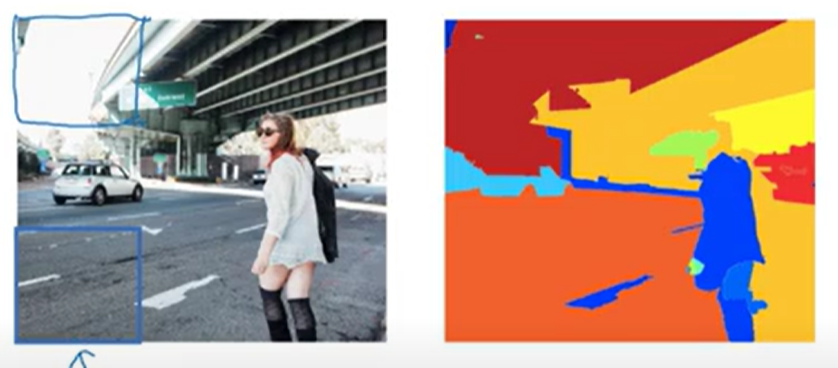

It contains around 2000 blobs.

# Andrew NG lecture

We have learn how to do classification. Now to learn object detection we first need to learn classification with localization, i.e., creating a bounding box around the classified object.

We consider the top left corner to be 0,0 and bottom right corner to be 1,1.

For image locatization, we find 4 parameters, bx, by, bh and bw.

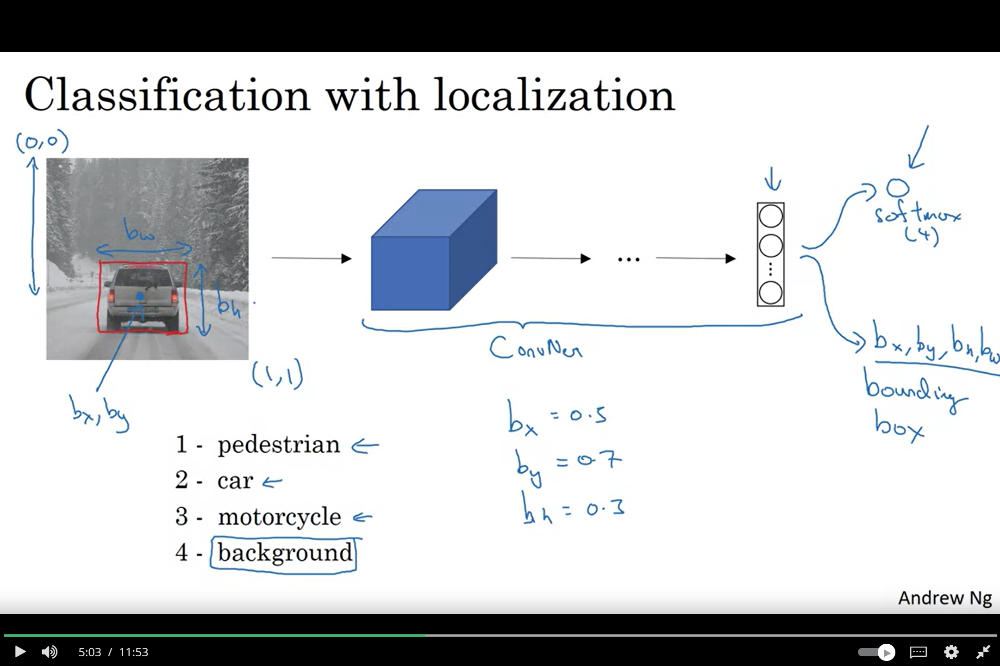

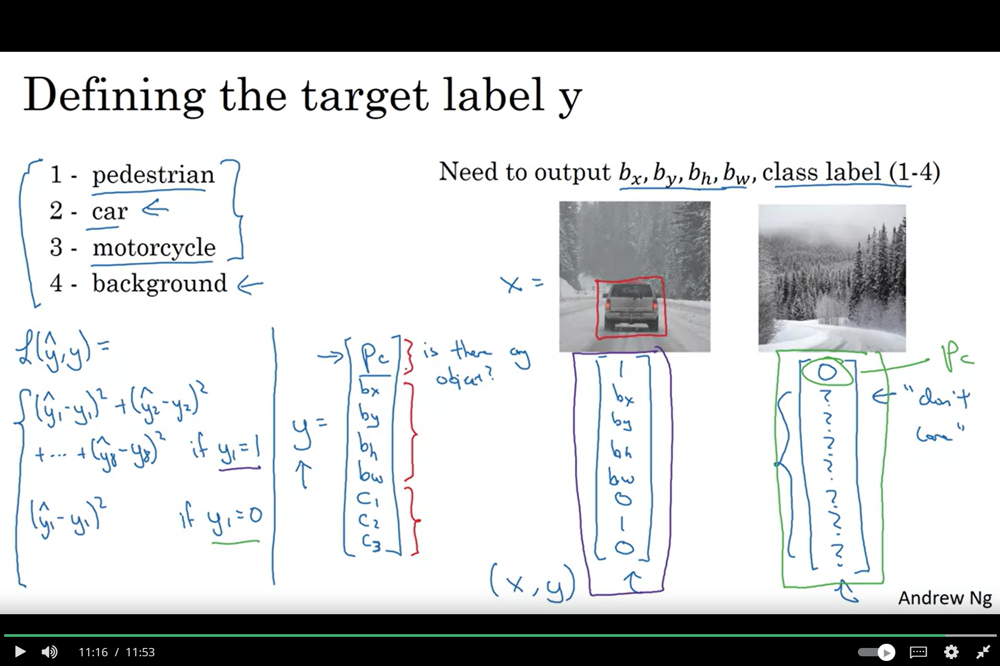

So, let's define the target label y as follows. Is going to be a vector where the first component pc is going to be, is there an object?
Play video starting at :5:55 and follow transcript5:55
So, if the object is, classes 1, 2 or 3, pc will be equal to 1. And if it's the background class, so if it's none of the objects you're trying to detect, then pc will be 0. And pc you can think of that as standing for the probability that there's an object. Probability that one of the classes you're trying to detect is there. So something other than the background class. Next if there is an object, then you wanted to output bx, by, bh and bw, the bounding box for the object you detected. And finally if there is an object, so if pc is equal to 1, you wanted to also output c1, c2 and c3 which tells us is it the class 1, class 2 or class 3. So is it a pedestrian, a car or a motorcycle. And remember in the problem we're addressing we assume that your image has only one object. So at most, one of these objects appears in the picture, in this classification with localization problem. So let's go through a couple of examples. If this is a training set image, so if that is x, then y will be the first component pc will be equal to 1 because there is an object, then bx, by, by, bh and bw will specify the bounding box. So your labeled training set will need bounding boxes in the labels. And then finally this is a car, so it's class 2. So c1 will be 0 because it's not a pedestrian, c2 will be 1 because it is car, c3 will be 0 since it is not a motorcycle. So among c1, c2 and c3 at most one of them should be equal to 1. So that's if there's an object in the image. What if there's no object in the image? What if we have a training example where x is equal to that? In this case, pc would be equal to 0, and the rest of the elements of this, will be don't cares, so I'm going to write question marks in all of them. So this is a don't care, because if there is no object in this image, then you don't care what bounding box the neural network outputs as well as which of the three objects, c1, c2, c3 it thinks it is.

## Land mark detection


Instead of 4 point, in just required 2 points. lx and ly.

Suppost we want to find where is the starting position of eyes.
Where is its middle position.

basic jawline or smile landmark points.

These are highly used in Snapchat to apply filters

## Sliding Window Experiment

In this experiment, we first train the model with the images, for eg car detection, we first provide images of car from difference direction.

Than for prediction we use a sliding boxes of varies size to go through entire image and find if the object is present in the image or not.

The main problem was the computational cost.

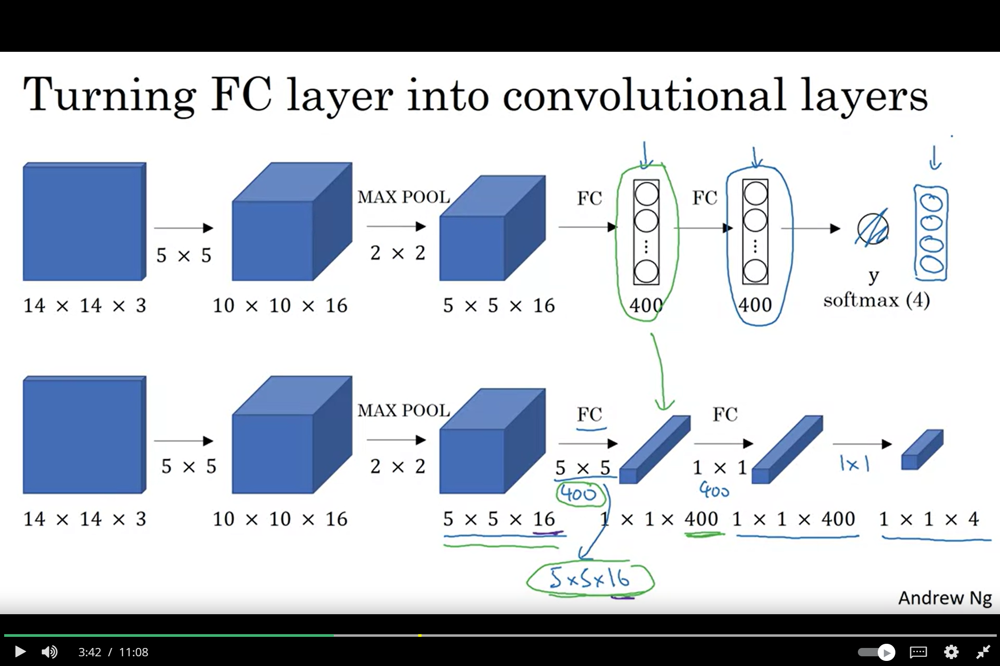

## Convolution implementation of sliding window

Here we do not slide the window. We break the ANN part that is the fully connected layers and implement these layers using convolution.

The advantage is that only in one convolution we get our result instead on sliding and calculating individual convolutions.



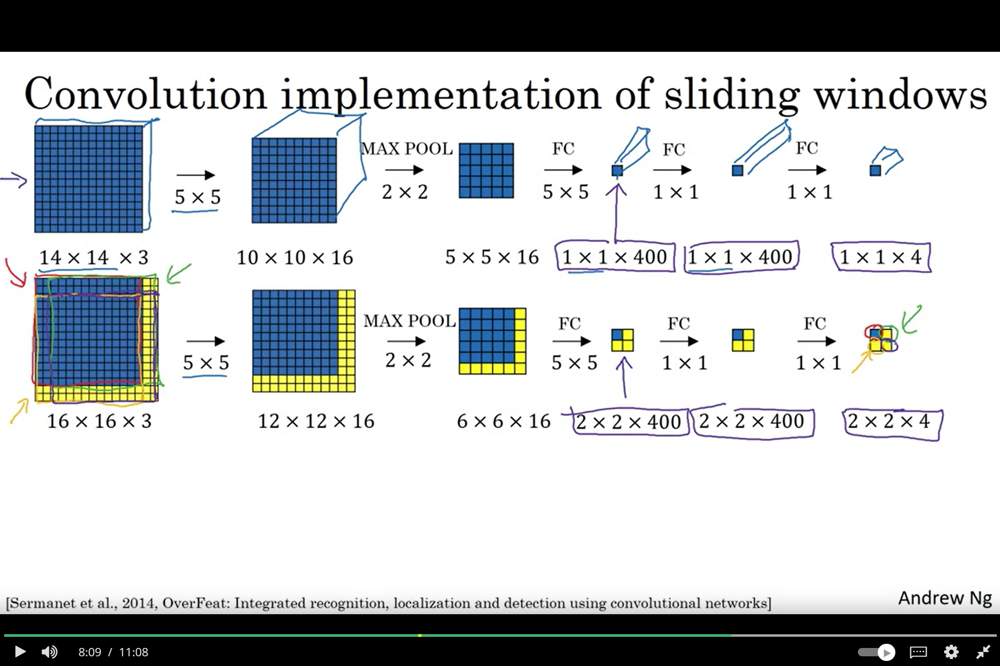

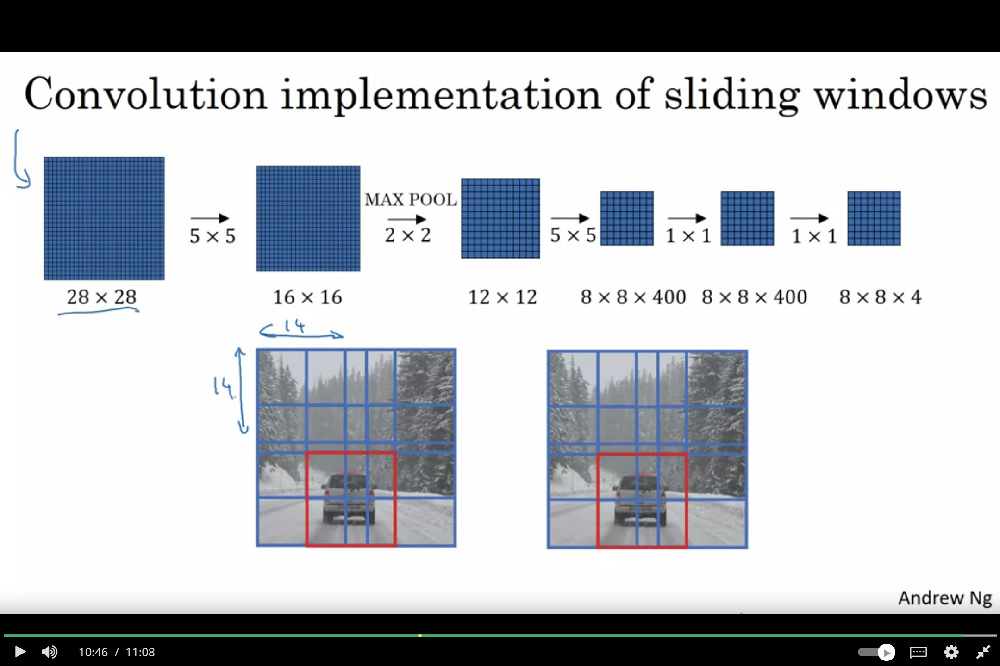

# Yolo(You only look once)

The algorithm first creates grid inside a image. Example 19,19 grid.

We search for 8 parameters in above example that is pc than bx, by, bh, bw, c1, c2, c3. If pc = 0, no object is present inside the box. so other values are don't care. If pc = 1, than the grid that contains the centre point of the object is marked as 1 and rest of the grid even if they contain that object pc = 0.

So looking just once we can determine the object. YOLO is so fast that it performs real time object detection.

# Evaluating Object Localization

IoU (Intersection over Union).

ratio of a intersection b to a union b.


# Non max suppression.

To detect the object only once we use this algo.
So that it does not detect same object multiple times.



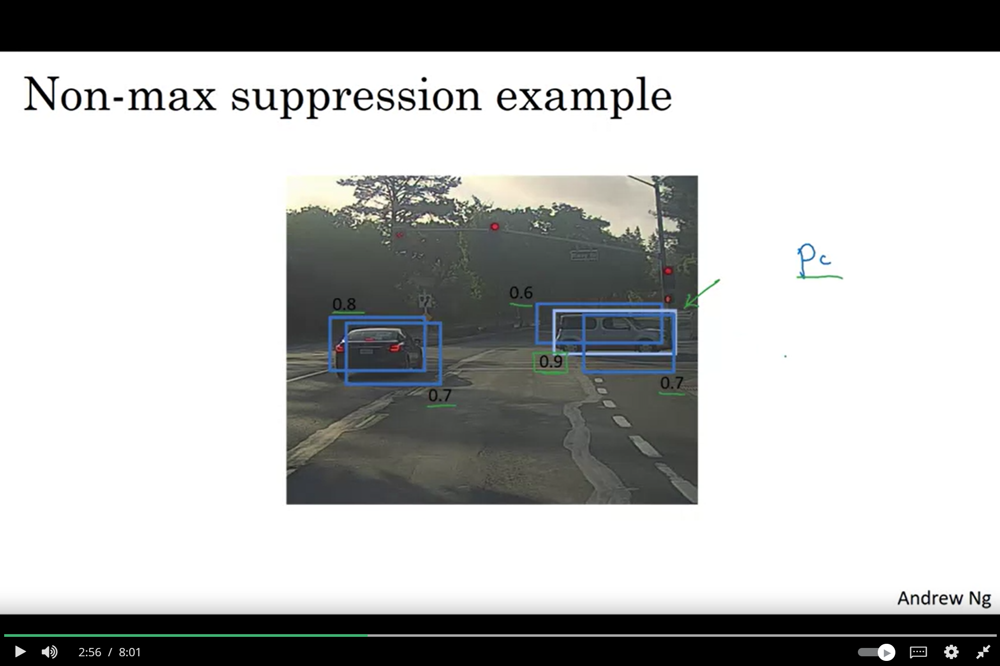

Begins by checking the probability of each bounding box and suppresses those boxes which have the low probability.

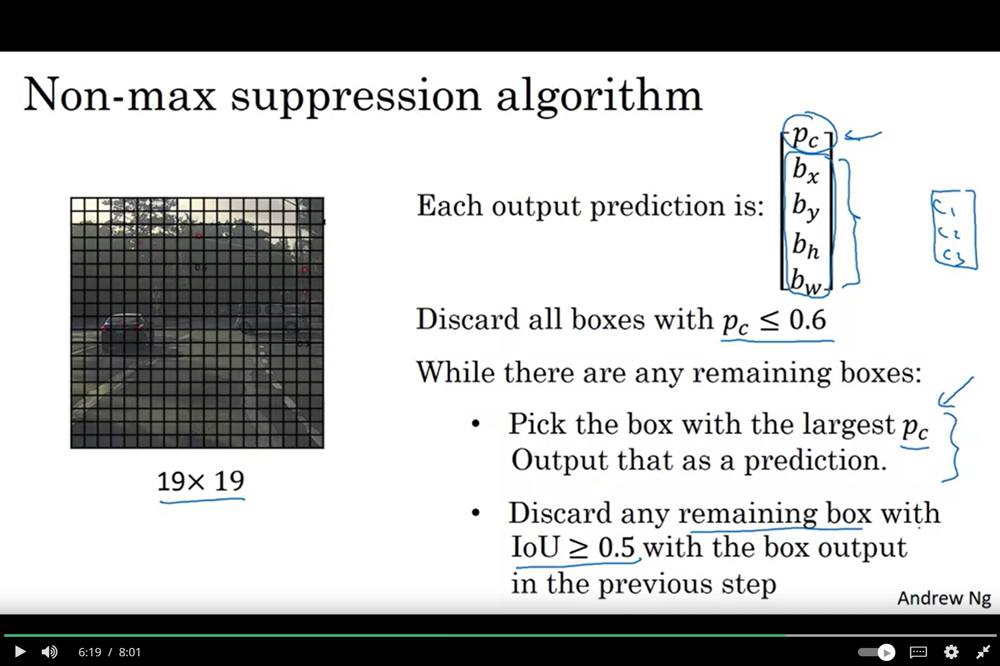

# Achor Boxes

This is used when the 2 objects overlap and have the same mid point. We expand the output. The box that has higher IoU is choosen.

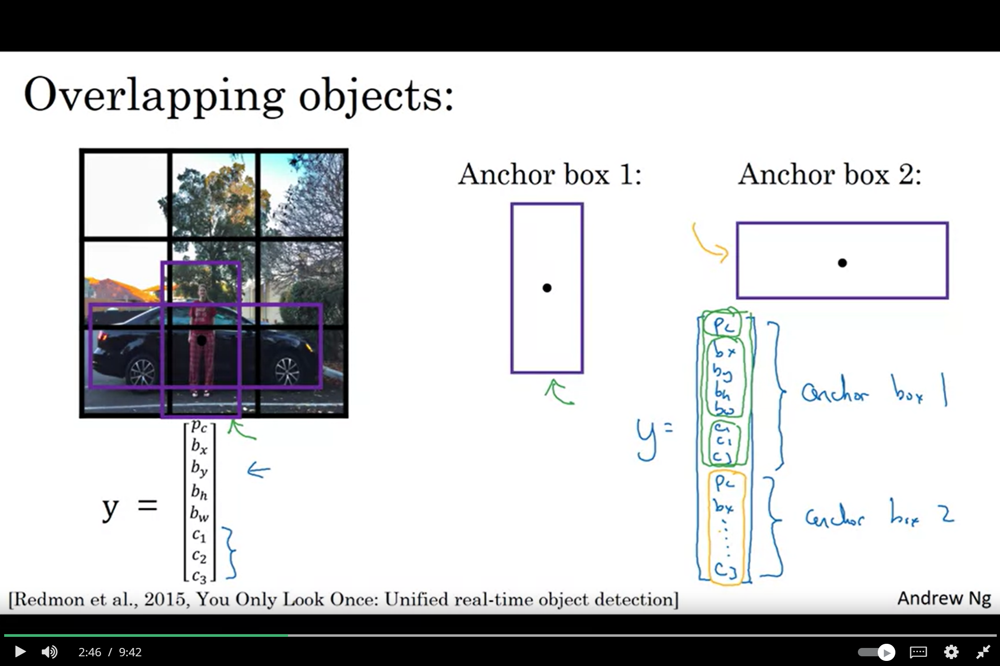

Achor boxes are rarely used when we have a 19, 19 grid the prob of overlapping of 2 mid points is quite less.

# R-CNN Region Proposal Convolution Neural Networks:

Here instead of using convolution of scan the entire image, or sliding block implementation, we do color segmentation, that is highlighting difference shades in different colors and the based on color segmentation we select suppose 2000 blocks for convolution.

R-CNN:
Propose regions. Classify proposed regions one at a
time.

Output label + bounding box.

Disadvantage was that it was slow.

So we came up with Fast RCNN

Fast R-CNN: Propose regions. Use convolution implementation
of sliding windows to classify all the proposed
regions.

Faster R-CNN: Use convolutional network to propose regions.


YOLO seems to be more interesting algorithm than RCNNs.

# Semantic Segmentation:

A very useful algorithm for computer vision application.

In semantic vision, the task is to find the edges of the object i.e. the exact boundaries of the object.

It has many practical applications.

1. In medical, intead of black and white x-rays, it will point out and highlight the exact spot where there is problem.

2. In MRI, example image of brain with tumor, it highlights the area where the Tumer is spread.

3. In Self Driving cars, it separates the Road with the object.

To determine the boundaries we use U-Net Algorithm

Same thing in Andrew's Language:

In medical imaging, given a chest X-ray, you may want to diagnose if someone has a certain condition, but what may be even more helpful to doctors, is if you can segment out in the image, exactly which pixels correspond to certain parts of the patient's anatomy. In the image on the left, the lungs, the heart, and the clavicle, so the collarbones are segmented out using different colors. This segmentation can make it easier to spot irregularities and diagnose serious diseases and also help surgeons with planning out surgeries. In this example, a brain MRI scan is used for brain tumor detection. Manually segmenting out this tumor is very time-consuming and laborious, but if a learning algorithm can segment out the tumor automatically; this saves radiologists a lot of time and this is a useful input as well for surgical planning. The algorithm used to generate this result is an algorithm called unit

How does it work:

Firstly we label each pixel, suppose for a car on road, we label the pixels corresponding car as 1 and road as 0. Now we train the algorithm with this data.

In this case, the job of the segmentation algorithm or the U-NET algorithm will be to output, either one or zero for every single pixel in this image, where a pixel should be labeled one, if it is part of the car and label zero if it's not part of the car

the neural network unit in this case, has to generate a whole matrix of labels. What's the right neural network architecture to do that?

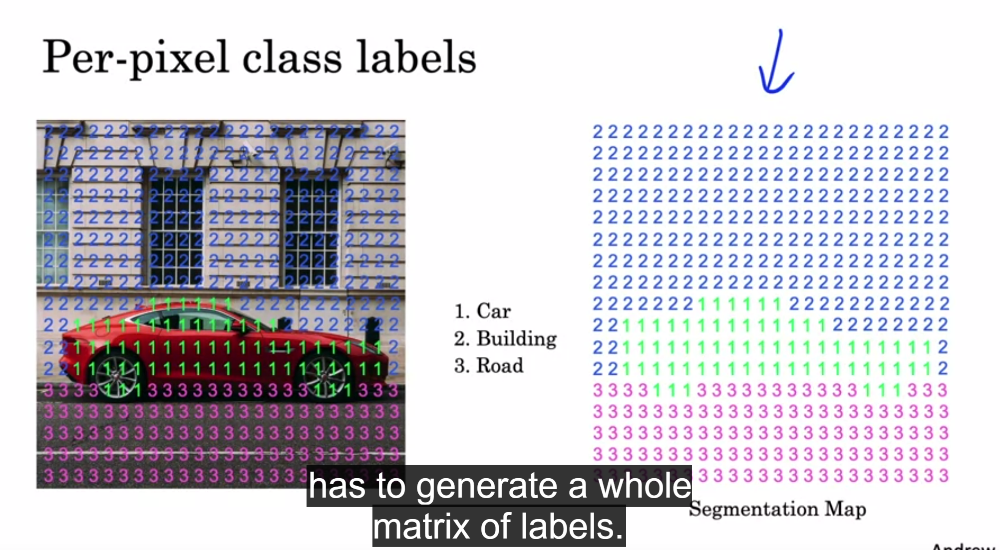

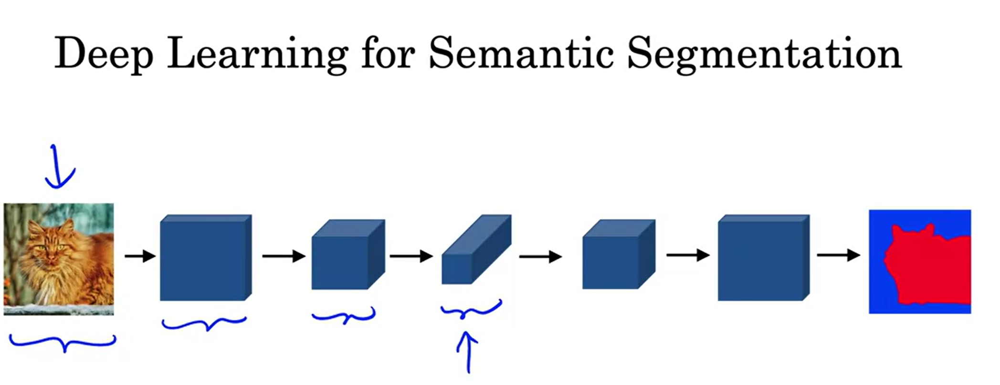

Specifically, this is what a unit architecture looks like. As we go deeper into the unit, the height and width will go back up while the number of channels will decrease so the unit architecture looks like this until eventually, you get your segmentation map of the cat.


In order to make this possible we need to learn Transpose Convolution.



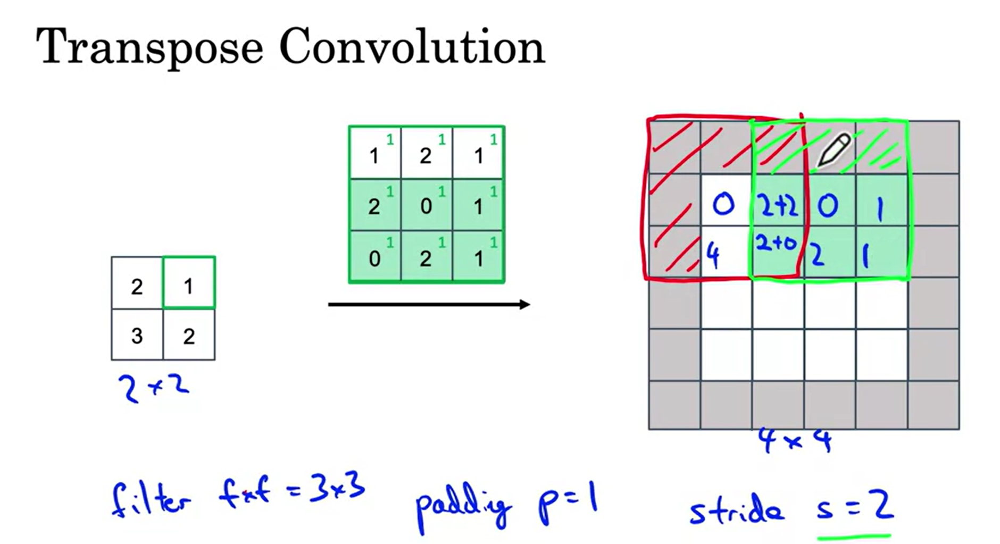

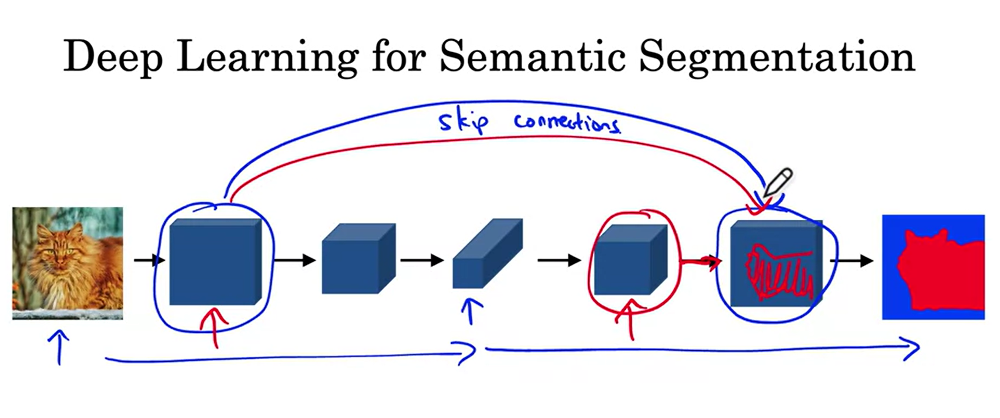

 So what the skip connection does is it allows the neural network to take this very high resolution, low level feature information where it could capture for every pixel position, how much fairy stuff is there in this pixel? And used to skip connection to pause that directly to this later layer. And so this way this layer has both the lower resolution, but high level, spatial, high level contextual information, as well as the low level. But more detailed texture like information in order to make a decision as to whether a certain pixel is part of a cat or not.